# Goal: Predict if project will be successfull

## Describe dataset

In [ ]:
%matplotlib notebook

# Import libs
import datetime
import dateutil
import keras
import nltk
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import plotly as py
import seaborn as sns
import string
from wordcloud import WordCloud, STOPWORDS

In [15]:
df = pd.read_csv('ks-projects-201801.csv')

In [16]:
# Describe dataframe
df.head()

,ID,name,category,main_category,currency,deadline,goal,launched,pledged,state,backers,country,usd pledged,usd_pledged_real,usd_goal_real
0,1000002330,The Songs of Adelaide & Abullah,Poetry,Publishing,GBP,2015-10-09,1000.0,2015-08-11 12:12:28,0.0,failed,0,GB,0.0,0.0,1533.95
1,1000003930,Greeting From Earth: ZGAC Arts Capsule For ET,Narrative Film,Film & Video,USD,2017-11-01,30000.0,2017-09-02 04:43:57,2421.0,failed,15,US,100.0,2421.0,30000.00
2,1000004038,Where is Hank?,Narrative Film,Film & Video,USD,2013-02-26,45000.0,2013-01-12 00:20:50,220.0,failed,3,US,220.0,220.0,45000.00
3,1000007540,ToshiCapital Rekordz Needs Help to Complete Album,Music,Music,USD,2012-04-16,5000.0,2012-03-17 03:24:11,1.0,failed,1,US,1.0,1.0,5000.00
4,1000011046,Community Film Project: The Art of Neighborhoo...,Film & Video,Film & Video,USD,2015-08-29,19500.0,2015-07-04 08:35:03,1283.0,canceled,14,US,1283.0,1283.0,19500.00


In [110]:
# Clean data a bit
df['is_success'] = df.apply(
    lambda x: int(x['state'] == 'successful'),
    axis=1
)

df['pledged_ratio'] = df.apply(
    lambda x: float(x['pledged']) / x['goal'],
    axis=1
)

df['length'] = df.apply(
    lambda x: (
        dateutil.parser.parse(x['deadline']) - \
        dateutil.parser.parse(x['launched'])).days,
    axis=1
)

df['pledged_month'] = df.apply(
    lambda x: \
        dateutil.parser.parse(x['launched']).replace(day=1).date(),
    axis=1
)

In [114]:
df['published_month'] = df.apply(
    lambda x: \
        dateutil.parser.parse(x['launched']).month,
    axis=1
)

df['published_dow'] = df.apply(
    lambda x: \
        dateutil.parser.parse(x['launched']).weekday(),
    axis=1
)

In [47]:
# Filter out data with broken dates
df = df[df['pledged_month'] > datetime.date(2009, 1, 1)]

In [111]:
DESCRETE_FEATURES = [
    'pledged_month',
    'category',
    'main_category',
    'currency',
    'country',
    'published_dow',
    'published_month'   
]

CONTINUOUS_FEATURES = [
    'pledged_ratio',
    'length',
    'usd_goal_real'
]

In [115]:
# Initialize plotly
py.offline.init_notebook_mode()

# Visulize distributions
def plot_descreate_distribution(df_, feature):
    """
    Plot descrete distributions for the feature.
    Plot separetely distributions for successfull and unsuccessful projects
    """
    df_successfull = df_[df_.is_success == True]
    df_unsuccessfull = df_[df_.is_success == False]
    successfull_distribution = df_successfull[feature].value_counts(
        normalize=True, sort=False)
    unsuccessfull_distribution = df_unsuccessfull[feature].value_counts(
        normalize=True, sort=False)
    data = [
        # distribution of successfull projects
        py.graph_objs.Bar(
            x=successfull_distribution.index.tolist(), 
            y=successfull_distribution.values,
            name='Successfull'
        ),        
        # distribution of unsuccessfull projects
        py.graph_objs.Bar(
            x=unsuccessfull_distribution.index.tolist(), 
            y=unsuccessfull_distribution.values,
            name='Unsuccessfull'
        ), 
    ]
    layout = py.graph_objs.Layout(title=feature)
    py.offline.iplot({
            'data': data, 
            'layout': layout})    
    
for feature in DESCRETE_FEATURES:
    plot_descreate_distribution(df, feature)

In [118]:
# Visulaize difference in successfull and unsuccessfull result
def plot_diff_btw_successfull_and_unsuccessful_results(
        df_, feature):
    """
    Plot difference btw rates of successfull 
    and unsuccessfull results in each category
    """
    def _get_relative_difference_btw_successful_and_unsuccessfull_projects_in_group(
            is_success_series
        ):
        """
        Caclulate relative difference between succsseffull and
        unsuccessfull results number
        """
        diff = 0.0
        for row in is_success_series:
            if row:
                diff += 1
            else:
                diff -= 1
        return diff / len(is_success_series)

    series = df_.groupby(feature)[['is_success', ]].agg(
        _get_relative_difference_btw_successful_and_unsuccessfull_projects_in_group)
    data = [
        py.graph_objs.Bar(
            x=series.index.tolist(), 
            y=series.is_success.values,
        ),               
    ]
    layout = py.graph_objs.Layout(title=feature)
    py.offline.iplot({
            'data': data, 
            'layout': layout})    


for feature in DESCRETE_FEATURES:
    plot_diff_btw_successfull_and_unsuccessful_results(df, feature)  

<IPython.core.display.Javascript object>


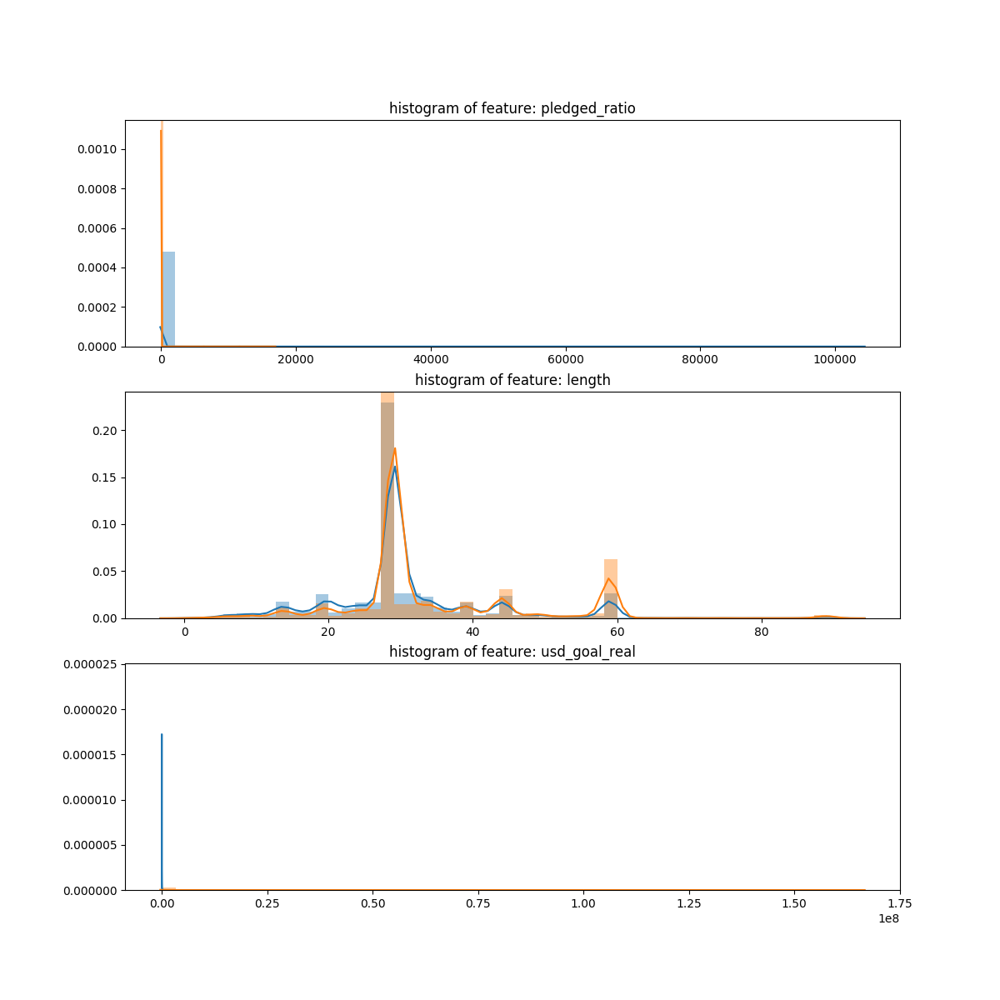

In [61]:
# Visualize continous distributions
def plot_continious_feature(df_, feature):
    """
    Visualize feature distribution using seaborn
    """
    sns.distplot(df_[feature][df_.is_success == 1], bins=50)
    sns.distplot(df_[feature][df_.is_success == 0], bins=50)

plt.figure(figsize=(12, len(CONTINUOUS_FEATURES) * 4))
gs = gridspec.GridSpec(len(CONTINUOUS_FEATURES), 1)
for i, feature in enumerate(CONTINUOUS_FEATURES):
    ax = plt.subplot(gs[i])
    plot_continious_feature(df, feature)
    ax.set_xlabel('')
    ax.set_title('histogram of feature: ' + str(feature))
plt.show()

<IPython.core.display.Javascript object>


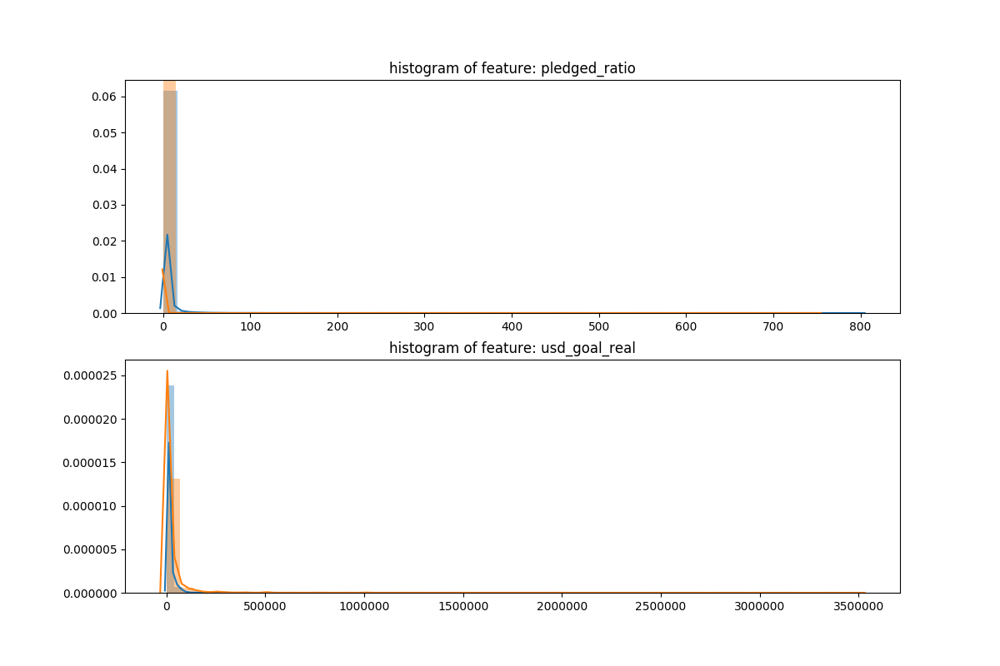

In [63]:
# Visualisation of features without huge outliers
CONTINUOUS_FEATURES_WITH_OUTLIERS = [
    'pledged_ratio',
    'usd_goal_real'
]

plt.figure(figsize=(12, len(CONTINUOUS_FEATURES_WITH_OUTLIERS) * 4))
gs = gridspec.GridSpec(len(CONTINUOUS_FEATURES_WITH_OUTLIERS), 1)
for i, feature in enumerate(CONTINUOUS_FEATURES_WITH_OUTLIERS):
    ax = plt.subplot(gs[i])
    df_ = df[
        (df[feature] > df[feature].mean() - 3 * df[feature].std()) & \
        (df[feature] < df[feature].mean() + 3 * df[feature].std())
    ]
    plot_continious_feature(df_, feature)
    ax.set_xlabel('')
    ax.set_title('histogram of feature: ' + str(feature))
plt.show()

## Does descriptions and names have impact on result?

<IPython.core.display.Javascript object>


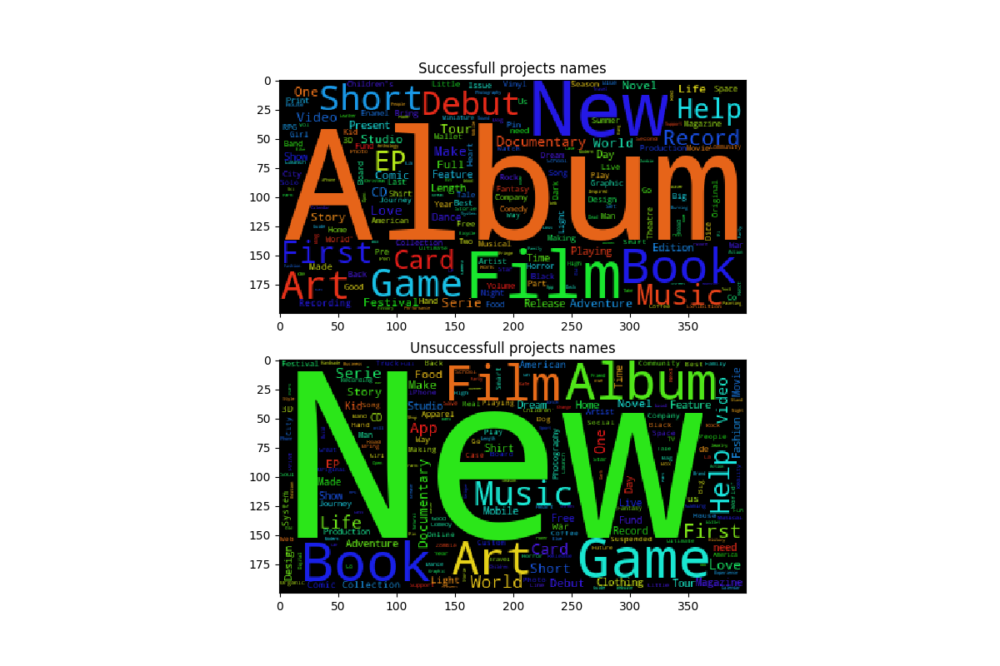

In [74]:
# Build word clouds
CUSTOM_STOPWORDS = {
    'project',
    'canceled',
}

def plot_wordcloud(
        sequence, title, ax):
    """
    Generate and plot wordcloud from dataframe
    """
    # concatatenate sequence values
    text = sequence.str.cat(sep=' ')
    wordcloud = WordCloud(
            relative_scaling = 1.0,
            stopwords = STOPWORDS.union(CUSTOM_STOPWORDS)).\
        generate(text)
    ax.imshow(wordcloud)
    ax.set_xlabel('')
    ax.set_title(title)

plt.figure(figsize=(12, 8))
gs = gridspec.GridSpec(2, 1)
plot_wordcloud(
    df['name'][df.is_success == True],
    'Successfull projects names',
    plt.subplot(gs[0])
)
plot_wordcloud(
    df['name'][df.is_success == False],
    'Unsuccessfull projects names',
    plt.subplot(gs[1])
)
plt.show()

In [71]:
# Examples of projects with "Cancelled" in name
df_cancelled = df[df.name.str.contains('cancelled', na=False)]
df_cancelled.head()

,ID,name,category,main_category,currency,deadline,goal,launched,pledged,state,backers,country,usd pledged,usd_pledged_real,usd_goal_real,is_success,pledged_ratio,length,pledged_month
2571,1013245029,Project is cancelled !!! (Canceled),Software,Technology,EUR,2016-01-07,10000.0,2015-12-08 23:06:48,0.0,canceled,0,DE,0.0,0.00,10860.95,0,0.000000,29,2015-12-01
27835,1141303983,Project cancelled (Canceled),Nonfiction,Publishing,GBP,2014-09-28,3000.0,2014-08-29 18:29:41,175.0,undefined,0,"N,0""",NaN,281.16,4819.90,0,0.058333,29,2014-08-01
50925,1259338022,Project cancelled. (Canceled),Art,Art,USD,2015-05-16,1888.0,2015-04-01 17:11:28,0.0,canceled,0,US,0.0,0.00,1888.00,0,0.000000,44,2015-04-01
92089,1467845237,cancelled (Canceled),Film & Video,Film & Video,USD,2014-09-10,75000.0,2014-08-11 01:42:42,13749.0,canceled,181,US,13749.0,13749.00,75000.00,0,0.183320,29,2014-08-01
92440,1469746217,cancelled (Canceled),Classical Music,Music,USD,2012-10-31,5000.0,2012-10-05 01:22:31,101.0,canceled,2,US,101.0,101.00,5000.00,0,0.020200,25,2012-10-01


In [116]:
# Canceled projects are not informative for us
# AS well as projects with undefined status
df_without_canceled = df[
    (df['state'] != 'canceled') & \
    (df['state'] != 'undefined')
]

In [109]:
# Plot words that are common to one class and not common to another
words_frequencies = {}
# Find words frequencies
def _get_tokens_from_name(name):
    """
    Helper to split name to tokens
    and filter out stop words
    """
    name = filter(lambda x: x in string.printable, name)
    return set([
        word for word in nltk.word_tokenize(name) 
        if word not in nltk.corpus.stopwords.words('english')
        and not word in CUSTOM_STOPWORDS
        and not word in string.punctuation
    ])

for _, row in df_without_canceled.iterrows():
    # filter non ascii symbols
    try:
        words = _get_tokens_from_name(row['name'])
    except TypeError as e:
        # looks like we got giberrish name
        # ok to skip
        print(e)
        continue
    counter_name = 'successfull' \
        if row.is_success == True \
        else 'failed'
    for word in words:
        words_frequencies[word] = words_frequencies.get(
            word, 
            {
                'successfull': 0.0,
                'failed': 0.0
            })
        words_frequencies[word][counter_name] += 1 

'float' object is not iterable
'float' object is not iterable
'float' object is not iterable
'float' object is not iterable


In [107]:
words_frequences_final = {}

STATISTICAL_SIGNIFICANCE_TRESHOLD = 30

# Calculate words rating inplace
for key, value in words_frequencies.items():
    if value['successfull'] + value['failed'] > STATISTICAL_SIGNIFICANCE_TRESHOLD:
        words_frequences_final[key] = \
            (value['successfull'] - value['failed']) / \
            (value['successfull'] + value['failed'])

# Plot most successfull and most unsuccessfull words
def plot_barchart(x, y, title):
    """
    Helper to plot arbitrary barchart
    """
    data = [
        py.graph_objs.Bar(
            x=x, y=y,
        ),               
    ]
    layout = py.graph_objs.Layout(title=title)
    py.offline.iplot({
            'data': data, 
            'layout': layout})    
    
words_frequencies_sorted = sorted(
    words_frequences_final.items(),
    key=lambda x: x[1])

SHOW_FIRST_WORDS_NUMBER = 15
words_frequencies_successfull = \
    words_frequencies_sorted[-SHOW_FIRST_WORDS_NUMBER:]
words_frequencies_successfull.reverse()
words_frequencies_unsuccessfull = \
    words_frequencies_sorted[:SHOW_FIRST_WORDS_NUMBER]
    
plot_barchart(
    [w[0] for w in words_frequencies_successfull],
    [w[1] for w in words_frequencies_successfull],
    'Successfull')

plot_barchart(
    [w[0] for w in words_frequencies_unsuccessfull],
    [w[1] for w in words_frequencies_unsuccessfull],
    'Unsuccessfull')

## Build neural network to predict if project will be successfull or not

In [1]:
# Prepare texts for embeddings
# Clean names
def _clean_name(name):
    """
    Return string without stop words and punctuation
    Or empty string
    """
    try:
        return ' '.join(_get_tokens_from_name(name))
    except TypeError as e:
        print('Error: ', e)
        return ''

df_without_canceled['name_cleaned'] = df_without_canceled.apply(
    lambda row: _clean_name(row['name']),
    axis=1
)

# Prepare embeddings params
embed_input_length = max(
    df_without_canceled['name_cleaned'].map(len)
)

NameError: name 'df_without_canceled' is not defined

In [122]:
all_names_text = df_without_canceled['name_cleaned'].str.cat(sep=' ')
print(all_names_text)

embed_vocab_size = len(
    set(
        nltk.word_tokenize(all_names_text)
    )
)

(0, set(['The', 'Adelaide', 'Abullah', 'Songs']))
(1, set(['Arts', 'From', 'For', 'ZGAC', 'Greeting', 'Capsule', 'ET', 'Earth']))
(2, set(['Hank', 'Where']))
(3, set(['Album', 'Needs', 'Help', 'Rekordz', 'ToshiCapital', 'Complete']))
(4, set(['Bar', 'Monarch', 'Espresso']))
(5, set(['Coffee', 'Energy', 'SolarCoffee.co', 'Green', 'Solar', 'Roasted', 'Support']))
(6, set(['Strips', 'make', 'B*tch', 'Shots', 'Our', 'Chaser']))
(7, set(['Madmen', 'Of', 'Jesus']))
(8, set(['New', 'Lisa', 'CD', 'Lim']))
(9, set(['Cottage', 'The', 'Market']))
(10, set(['Gamers', 'eachother', 'Place', 'connect', 'G-Spot', 'go', 'pro']))
(11, set(['Old', 'West', '32mm', 'miniatures', 'game', 'Tombstone', 'tabletop']))
(12, set(['Survival', 'Rings']))
(13, set(['The', 'Beard']))
(14, set(['London', 'Notes', 'From', 'Below', 'Above']))
(15, set(['Album', 'Mike', "'s", 'Darkness', 'Light', 'Corey']))
(16, set(['Tea', 'Boco']))
(17, set(['Life', 'CMUK', 'Shoes', 'Feet', 'Take', 'First']))
(18, set(['fundraiser', 'b

(11560, set(['Tattoo', 'funding', 'apprenticeship']))
(11561, set(['promote', 'Help', 'Strangefruit']))
(11562, set(['Charlotte', 'Retrospect', 'In']))
(11563, set(['Portraits', 'Dog']))
(11564, set(['Really', 'Oh']))
(11565, set(['Wild', 'Music', 'Arts', 'Festival', 'Midwest']))
(11566, set(['Pink', 'Lemonade']))
(11567, set(['Bad', 'Giftcard', 'Amazon', 'Luck']))
(11568, set(["'s", 'Jay', 'Financed', 'Community', 'Initiative', 'Ackley', 'Folk']))
(11569, set(['Fashion', 'Narrative']))
(11570, set(['Ball', 'Pittsburgh', 'Society', 'Black', 'Witches', 'The', 'Hat']))
(11571, set(['Kuwan']))
(11572, set(['straw', 'pine', 'innovation']))
(11573, set(['Her', 'CD', '1', 'Part', 'Ly', 'Adventure', 'Tartell', 'Shiny', 'Happy']))
(11574, set(['A', 'All', 'For', 'Sixth', 'Pocket', 'Sense', 'Molecular', 'Sensor', 'Your', 'SCiO']))
(11575, set(['A', 'ghost-hunting', 'GhostControl', 'simulation', 'hilarious', 'Inc.']))
(11576, set(['Very', 'private', 'Personal', 'Totempod', 'carry', 'wearable', '

(25595, set(['Album', 'New', 'Mindslip', 'The', 'Self-Titled']))
(25596, set(['Lancaster', 'Restoration', 'Avro', 'KB882']))
(25597, set(['Corsairs', 'Four', 'Catnip', 'Book', 'Catbeard', 'The', 'Pirate', 'Relaunch']))
(25598, set(['Folio', 'Launch', 'Module', '2', '1E', '5E', 'The']))
(25599, set(["'s", 'Jerkforce', 'Season', 'Up', 'One', 'Mom', 'Basement']))
(25600, set(['System', 'Sports', 'Hydration', 'Xtreme', 'Dolfin', 'Pack']))
(25601, set(['Real', 'GlassX', 'Liquid', 'Screen', 'Glass', 'Protection', 'Universal']))
(25602, set(['album', 'decker', '4th', 'The', 'unnamed', 'yet']))
(25603, set(['Refiguring', 'Art', 'Inaugural', 'Biblical', 'Exhibition']))
(25604, set(['YOURS', 'footwear']))
(25605, set(['The', 'Art', 'Dead', 'Show']))
(25606, set(['Drunken', 'Print', 'Issue', 'Absurdity']))
(25607, set(['Better', 'Make', 'working', 'title']))
(25608, set(['A', 'Reservoir', 'Heist', 'Hounds', 'film', 'The', 'Shakesperian']))
(25609, set(['A', 'love', 'inspire', 'give', 'Video', 'Mu

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(154040, set(["''", 'The', 'Surfing', 'Art', '``']))
(154041, set(['daughter', 'Spain', 'send']))
(154042, set(['Hunters', 'Booty']))
(154043, set(['CountByMacros']))
(154044, set(['Timepieces', 'Marble', 'Italian', 'Vincero', 'Mechanical']))
(154045, set(['Goddess', 'people', 'Age', 'Within', 'sized', 'plus', 'wear', 'New']))
(154046, set(['2015', 'Fantasy', 'Calendar', 'Spellbound', 'Gothic']))
(154047, set(['jewellery', 'commissions', 'Chiro', 'Glass', 'Samhain', 'bead']))
(154048, set(['BIG', 'THE', 'short', 'HIT', 'film']))
(154049, set(['Norway', 'Trip']))
(154050, set(['Website', 'Business', 'Restaurant', 'Stop', 'Solution', 'One']))
(154051, set(['AGAIN', 'STORY', "'S", 'HEMINGWAY', 'TIME', 'BACK', 'JOE', 'IN', 'ERNEST', 'OUR']))
(154052, set(['Forge', 'ELDERFIRE', 'Game', 'Destiny', 'Role-playing']))
(154053, set(['Failure', 'The', 'American', 'Great', 'Documentary']))
(154054, set(['Sarah', 'On', 'Showcase', 'One', 'Black', 'Year', "'15", 'Rebecca']))
(154055, set(['Southeast

(173938, set(['Happens', 'Charette']))
(173939, set(['putting', 'buy', 'Stop', 'tomorrow', 'today']))
(173940, set(['Project', '``', 'Media', "''", 'Propitiation', 'Senior', 'Film']))
(173941, set(['--', 'Fire', 'New', 'Hearts', 'The', 'Aduro', 'EP']))
(173942, set(['Write', 'Story', 'OMNE', 'Your']))
(173943, set(['Novel', 'Wahkan', 'The', 'My', 'Legend', 'First']))
(173944, set(['Moments', 'Making', 'Happen']))
(173945, set(['Food', 'commercial', 'Safety', 'Community', 'Residential']))
(173946, set(['planta1arbol', 'CROWDFARMING', 'planter1arbre', 'BaumPflanzen']))
(173947, set(['A', 'Album', 'Treasures', 'Sacred', 'Hidden', 'Harp']))
(173948, set(['Last', 'Island', 'Rhode', 'Wake', 'Trap', 'In', 'Fishermen', "'s", 'The', 'History']))
(173949, set(['evolution', 'Series-', 'Did', 'shape', 'music', 'human', '8', 'Documentary', 'Songs']))
(173950, set(['A', 'recovery', 'memoir', 'Crystal', 'Clean', 'meth', 'addiction']))
(173951, set(['Shell.IO']))
(173952, set(['Charter', 'Ancient', 'L

(185764, set(['Morphology', 'Junior']))
(185765, set(['Vision/Verse', '2009-2013', 'Poetry', 'Anthology']))
(185766, set(['Eluvium', 'Brewing', 'Company']))
(185767, set(['Emporium', 'Gin', 'The', 'Tour', 'On']))
(185768, set(['Massey', 'album', '``', 'His', "'s", 'Rose', 'debut', "''", 'Hands', 'In', 'Emily']))
(185769, set(['SAFETY', 'interNET']))
(185770, set(['Printable', 'Steampunk', 'Miniatures', 'Game', 'Progress', 'Tragedy', '3D']))
(185771, set(['Lameaux', '2', 'Round']))
(185772, set(['Food', 'Jiak', 'Guide', 'Singapore']))
(185773, set(['II', 'Scratch', 'Much', 'Soul', 'More']))
(185774, set(['I', 'Series', 'DrumArcade', 'Rhythm-Play', 'Game', 'Volume', "'Video", 'Shakers']))
(185775, set(['Artist', 'VI', 'Age', 'ALBEDO', 'Fantasy', 'Music', 'New', 'Final']))
(185776, set(['39', 'around', 'coffee', 'Alchemy', 'Coffee', 'world', 'drinks']))
(185777, set(['Sightline', 'Maps', 'See', 'way', 'world', 'new']))
(185778, set(['Volume', 'RUSH', '2112', 'Toons', 'Fantoons']))
(185779

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(315410, set(['album', 'Jake', 'Fossils', 'debut', 'Decker', 'The']))
(315411, set(['En', 'bok']))
(315412, set(['theatre', 'show', 'I', 'Unicorns', 'Morpurgo', 'Believe', 'Interactive']))
(315413, set(['On', '``', 'Ice', "''", 'Billiard', 'Table', 'Pool']))
(315414, set(['//', 'Columbus', 'Muertos', 'de', 'Dead', 'Los', 'The']))
(315415, set(['Hip', 'The', 'Cafe', 'Original', 'Hop']))
(315416, set(['Strange', 'Lyrics', 'Thoughts', 'Women']))
(315417, set(['The', 'Michael', 'Rebel']))
(315418, set(['Sisters', 'arms-studio', 'sessions']))
(315419, set(['AMABELLE', 'The', 'debut', 'AGUILUZ', 'collection']))
(315420, set(['A', 'Art', 'Space', 'Gallery', 'Digital', 'Pixel', 'Experimental']))
(315421, set(['worlds', "'s", 'corners', 'York', 'angles', 'small', 'New']))
(315422, set(['Under', 'God', 'Nation', 'Poster', 'One']))
(315423, set(['miniature', 'game', 'Drakerys']))
(315424, set(['//', 'Summer', 'IXIX', '1', 'Magazine', 'Issue', '2013']))
(315425, set(['A', 'Awakened', 'Novel', 'Lo

(328247, set(['Skin', 'My', 'Under']))
(328248, set(['CHRONOLOGY']))
(328249, set(['Craftsmanship', '2017', 'Calendar', 'Software']))
(328250, set(['Art', 'Liquid', 'Show', 'Light', 'Void', 'Above', 'Installation', 'The', '3D']))
(328251, set(['Pair', 'Grow']))
(328252, set(['Natural', 'Zoe', 'Juice', 'Pure', 'Goodness', 'Bar']))
(328253, set(['Videography/Surveillance/Inspections', 'Aerial', 'UAV']))
(328254, set(['Brain', 'The', 'Restoration', 'Atomic', '4K']))
(328255, set(['Party', 'Nutcracker', 'Scene', 'Costumes']))
(328256, set(['``', 'Short', 'Funding', 'Crotchless', "''", 'Film']))
(328257, set(['Sticker', 'Custom', 'Platform', 'Decal', 'Design', 'DIY', 'Digital']))
(328258, set(['Web', 'Pretty-fy', 'Thy', 'Reaper', 'Design', 'Intenet']))
(328259, set(['Project', 'Theory', 'A.M.E', '2', 'The', 'Musical', 'F.']))
(328260, set(['Map', 'Ravenstein', 'Game', 'Role', 'Castle', 'Playing']))
(328261, set(['Dhammacon']))
(328262, set(['Junkie', 'Life', 'Suspended']))
(328263, set(['cl

TypeError: sequence item 0: expected string, set found

Error in atexit._run_exitfuncs:
Traceback (most recent call last):
  File "/System/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/atexit.py", line 24, in _run_exitfuncs
    func(*targs, **kargs)
  File "/Users/andiudina/work/ENV/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 3216, in atexit_operations
    self.reset(new_session=False)
  File "/Users/andiudina/work/ENV/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 1205, in reset
    self.displayhook.flush()
  File "/Users/andiudina/work/ENV/lib/python2.7/site-packages/IPython/core/displayhook.py", line 295, in flush
    gc.collect()
KeyboardInterrupt


In [ ]:
# Prepare non text features
FINAL_DESCRETE_FEATURES = [
    'pledged_month',
    'published_month',
    'category',
    'main_category',
]

FINAL_CONTINUOUS_FEATURES = [
    'usd_goal_real'
]

# Encode descreate features
descrete_features_encoded = []
for feature in FINAL_DESCRETE_FEATURES:
    for val in df_without_canceld[feature].unique():
        new_feature_name = '%s-%s' % (feature, val)
        df_without_canceled[new_feature_name] = df_without_canceled.apply(
            lambda row: int(row[feature] == val),
            axis=1
        )
        descrete_features_encoded.append(new_feature_name)

In [ ]:
# Scale data
continuous_features_scaled = []
for feature in FINAL_CONTINUOUS_FEATURES:
    current_min = df_without_canceled[feature].min()
    current_max = df_without_canceled[feature].max()
    df_without_canceled['%s_scaled' % feature] = df_without_canceled.apply(
        lambda row: float(row[feature] - current_min) / (current_min - current_max),
        axis=1
    )
    continuous_features_scaled.append('%s_scaled' % feature)
    
FINAL_NON_TEXT_FEATURES = \
    continuous_features_scaled + \
    descrete_features_encoded

In [ ]:
# Prepare data
X_embed = df_without_canceled[['cleaned_name', ]].as_matrix
X = df_without_canceled[FINAL_NON_TEXT_FEATURES].as_matrix
df_without_canceled['is_failed'] = df_without_canceled.apply(
    lambda row: int(not row['is_success'])
)
y = df_without_canceled[['is_success', 'is_failed']].as_matrix

# Split data to test and train datasets
X_embed_shaffled = np.random.shuffle(X_embed)
X_shaffled = np.random.shuffle(X)
y_shaffled = np.random.shuffle(y)

TEST_RATE = 0.3
X_embed_train = X_embed_shaffled[: int(X_embed_shaffled.shape[0] * (1 - TEST_RATE))]
X_embed_test = X_embed_shaffled[: int(X_embed_shaffled.shape[0] * TEST_RATE)]
X_train = X_shaffled[: int(X_shaffled.shape[0] * (1 - TEST_RATE))]
X_test = X_shaffled[: int(X_shaffled.shape[0] * TEST_RATE)]
y_train = y_shaffled[: int(y_shaffled.shape[0] * (1 - TEST_RATE))]
y_test = y_shaffled[: int(y_shaffled.shape[0] * TEST_RATE)]

In [ ]:
# Build NN
# Variables
embed_size = 64
batch_size = 1000
epochs = X.shape[0] / batch_size

# Embeddings
embeddings = keras.layers.Embedding(
    inout_dim=embed_vocab_size + 1,
    output_dim=embed_size, 
    input_length=embed_input_length,
    mask_zero=0
)
lstm = keras.layers.LSTM(
    output_dim=300, 
    dropout=0.3, 
    recurrent_dropout=0.3)(embed)

# Not text features
non_text_input = \
    keras.layers.Input(
        shape=(len(FINAL_NON_TEXT_FEATURES), ))

# Combine two models
concatenation_layer = keras.layers.concatenate((lstm, non_text_input))
dropout = keras.layers.Dropout(0.6)(concatenation_layer)
dense_layer = keras.layers.Dense(len(FINAL_NON_TEXT_FEATURES))(dropout)
activation_layer = keras.layers.Activation('sigmoid')(dense_layer)

# Build final model
model = keras.models.Model(
    inputs=[embed, agei], 
    outputs=activation_layer,
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Train model
model.fit(
    [
        X_embed_train,
        X_train,
    ], 
    y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(
        [
            X_embed_test,
            X_test,            
        ], 
        y_test))